# Diseño de software

----

### Análisis estático de código

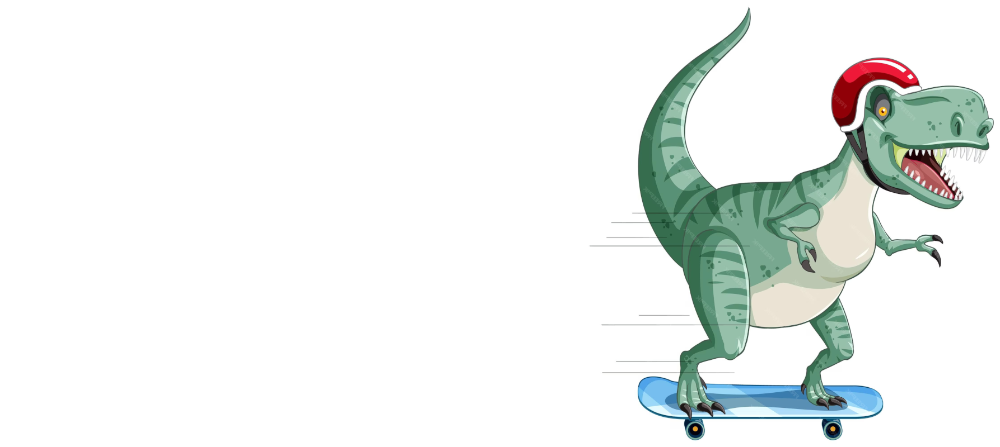 

## Códe estyle

> Se pasa más tiempo leyendo código que escribiéndolo. 
> **Readability counts** (PEP 20)

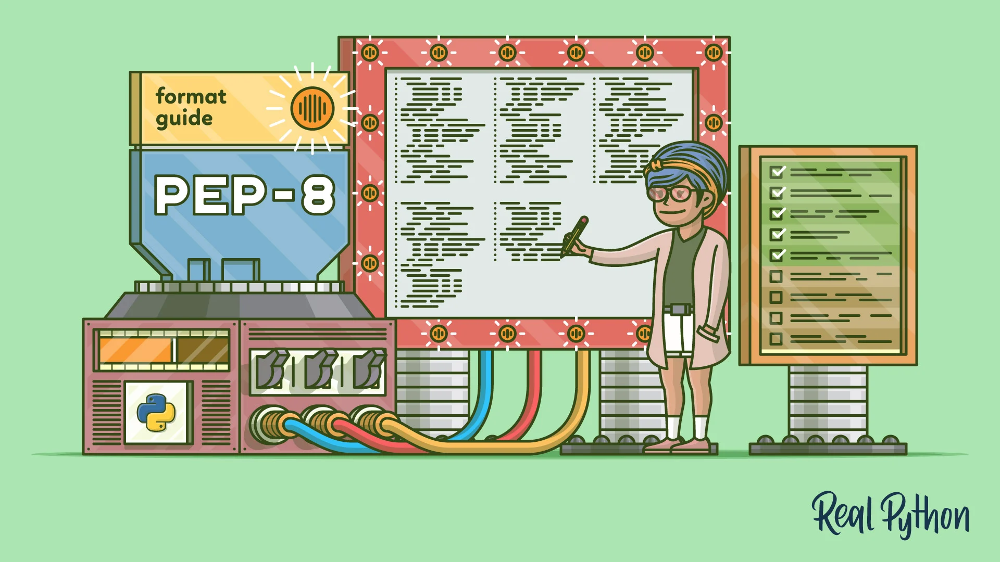

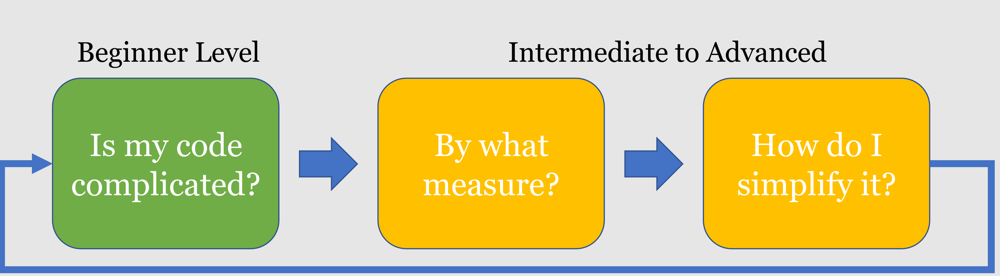

## Por que el code-style importa

> Se pasa más tiempo leyendo código que escribiéndolo. 
> **Readability counts** (PEP 20)
 
1. **Legibilidad y Mantenibilidad:** Si es más fácil de leer, es más fácil de entender y es más fácil de mantener.
2. **Colaboración:** Cualquier miembro de unl equipo puede entender el código de los demás más rápidamente.
3. **Reducción de Errores:** Es más fácil detectar problemas de lógica o sintaxis cuando el código se presenta de manera ordenada y coherente.
4. **Facilita la Depuración:** Es más fácil identificar la ubicación de los problemas en un código ordenado
5. **Adherencia a Estándares:** Mantiene la coherencia en el código y para garantizar que cumpla con las mejores prácticas de los estándares
6. **Eficiencia y Productividad:** Se reduce la necesidad de adivinar cómo funciona el código o de revisar constantemente la documentación.
7. **Estándares de la Industria:** En algunos casos, seguir un estilo de código específico es necesario para cumplir con estándares de la industria o regulaciones gubernamentales. Por ejemplo, en el desarrollo de software médico o aeroespacial, se pueden imponer reglas estrictas sobre la calidad del código y la documentación.


## Herramientas de code-style

- **PEP8:** Guía de estilo oficial de Python.
- **autopep8:** Reformatea el código Python para cumplir con PEP8 automáticamente.
- **flake8:** Verifica PEP8, errores de sintaxis y realiza análisis estático.
- **pylint:** Encuentra errores y problemas de estilo, proporciona sugerencias.
- **black:** Reformatea el código para simplicidad y consistencia.
- **isort:** Organiza las importaciones según PEP8.
- **mypy:** Verifica estáticamente los tipos de Python.
- **bandit:** Busca vulnerabilidades de seguridad y problemas de estilo.


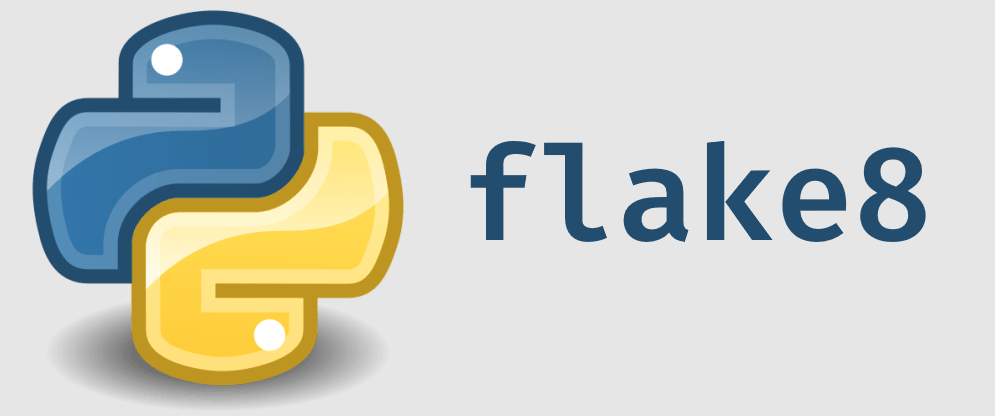


[Flake8](https://github.com/PyCQA/flake8) es un herramienta que sirve para **chequear** el estilo de código Python.
Esta diseñada sobre otras herramientas y se puede extender su funcionalidad con diversos plugins.


Para correr en la terminal tenemos estas opciones:
```
flake8
flake8 file.py
flake8 /path/to/folder/
```

## Ejemplo con flake8

In [2]:
!flake8 codes/style_example.py

codes/style_example.py:0:1: E902 FileNotFoundError: [Errno 2] No such file or directory: 'codes/style_example.py'


El estilo que revisa no es exactamente PEP8. Hay [varios plugins](https://github.com/DmytroLitvinov/awesome-flake8-extensions) que se agregan para estilos especializados.

Por ejemplo:
   - flake8-import-order  (verifica el orden de los imports)
   - flake8-black  (menciona los cambios que haría black)
   - pep8-naming   (verifica los nombres de variables, funciones, clases, etc.)
   - flake8-builtins (prohibe el uso de funciones de python como nombres de variables)

In [ ]:
!pip install flake8-import-order pep8-naming flake8-black

In [ ]:
flake8 codes/style_example.py

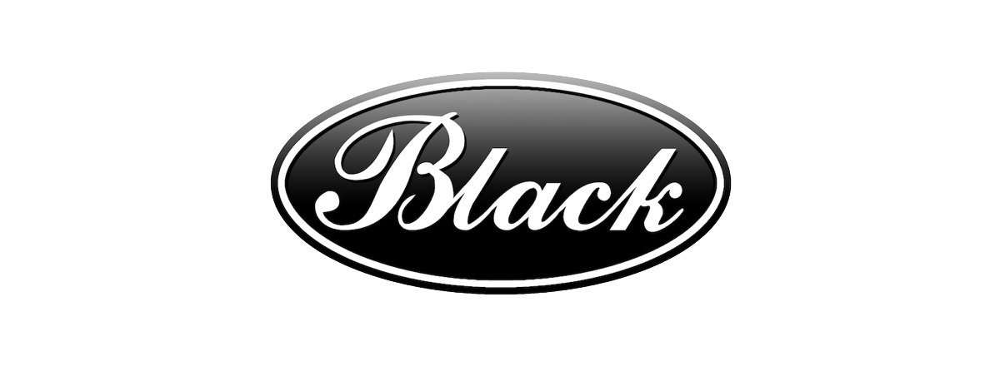

Es un **formateador** (*linter*) de codigo para apegarse al estándar PEP8. *Ojo que sobreescribe los archivos!*

Revisa que el AST sea igual antes y despues de formatear. Funciona con poca (o nula) configuración y te ahorra tener que pensar.

Tiene opciones para evitar formatear secciones de código:
   - No formatea bloques que empiecen con **# fmt: off** y terminen con **# fmt: on**.
   - No formatea líneas que terminen con **# fmt: skip**.

In [ ]:
pip install black

In [ ]:
black codes/style_example.py -l 80

## Algunas consideraciones sobre LOC

- **Physical SLOC (LOC):** Es un recuento de líneas en el texto del código fuente del programa, excluyendo comentarios. Es sensible a convenciones de estilo y formato lógicamente irrelevantes
- **Logical SLOC (LLOC):** intenta medir el número de "declaraciones" ejecutables. Esta vinculado a lenguajes específicos (una medida SLOC lógica simple para lenguajes de programación tipo `C` es el número de puntos y comas que terminan en declaraciones).

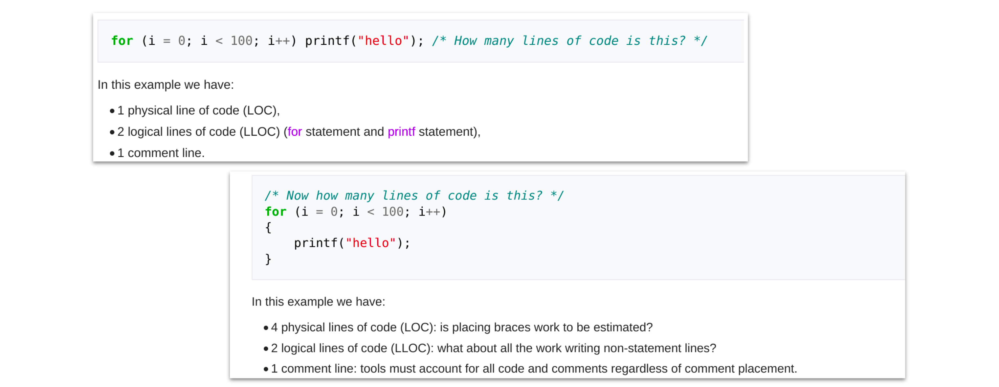



## Algunas consideraciones sobre LOC

La herramienta es `cloc` (https://github.com/AlDanial/cloc)

```bash
$ cloc skcriteria/
      50 text files.
      50 unique files.                              
       0 files ignored.

github.com/AlDanial/cloc v 1.90  T=0.13 s (375.8 files/s, 86672.0 lines/s)
-------------------------------------------------------------------------------
Language                     files          blank        comment           code
-------------------------------------------------------------------------------
Python                          48           2637           4870           3804
JSON                             2              0              0            220
-------------------------------------------------------------------------------
SUM:                            50           2637           4870           4024
-------------------------------------------------------------------------------
```



# Complejidad Ciclomática ($C$)

- Métrica de ingeniería de software para medir la complejidad de un programa.
- Creada por Thomas J. McCabe en la década de 1970.
- Mayor $C$ indica mayor complejidad del programa.
- Mayor complejidad puede dificultar el mantenimiento y la depuración del código.
- Guía para simplificar y mejorar el código.
- No necesariamente indica defectos en el programa.
- Es análisis de código estático, solo busca un límite teórico.

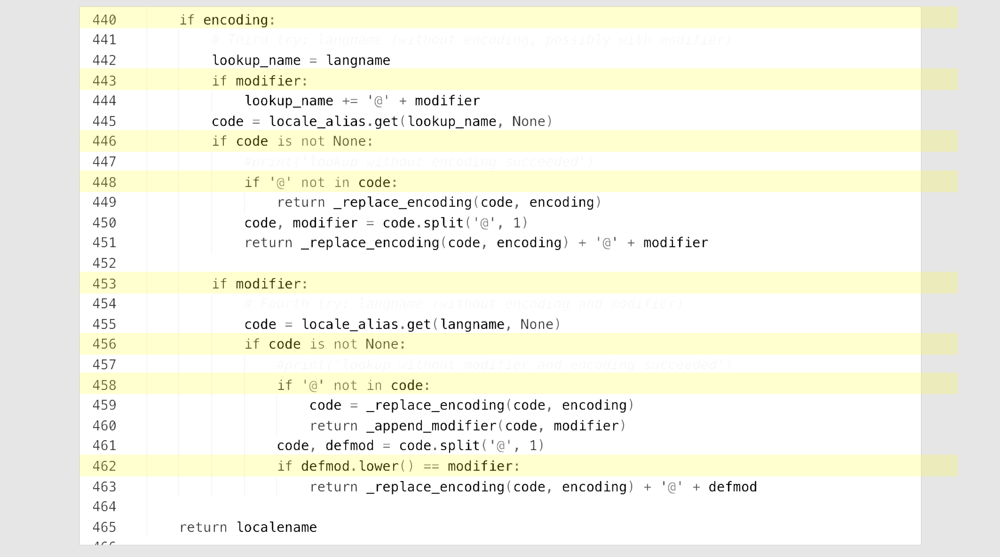

## Hay conocimiento en código complicado

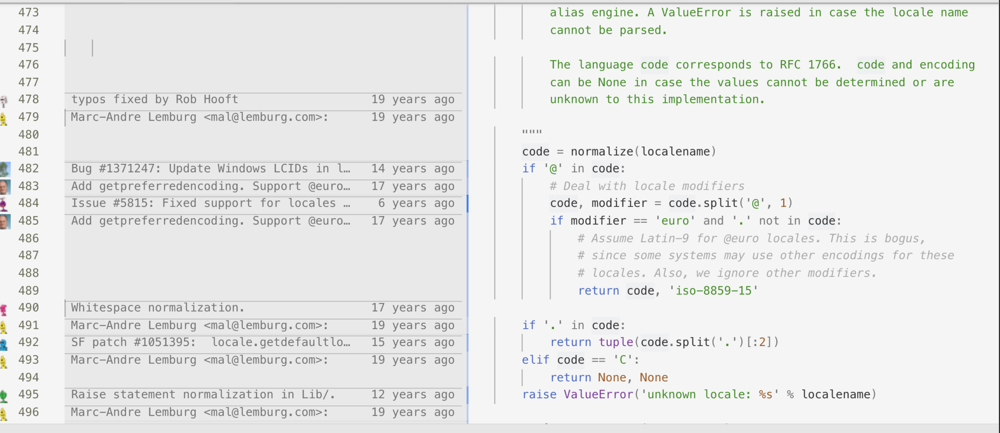

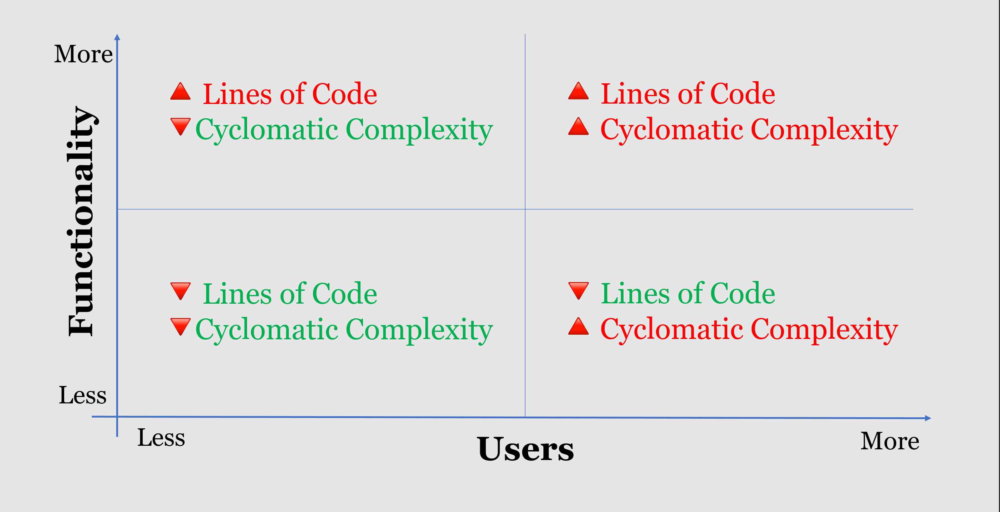

## Complejidad Ciclomática


### Cálculo

1. Crea un grafo dirigido para representar el flujo de control del programa.
2. Nodos ($N$): Puntos de decisión (bucles, condicionales, saltos).
3. Aristas ($E$): Transiciones entre nodos.
4. Aplica la fórmula: $C = E - N + 2P$.
   - Donde $P$ es ela cantidad de nodos de salida (`return`)

   Se puede simplificar la fórmula como

   $C = Condiciones + max(returns, 1)$

### McCabe complexity threshold

El valor de umbral de complejidad de McCabe es un número arbitrario que se elige para un proyecto o una organización específica. En muchos casos, se establece en un valor como `10` o `15`.

Flake8 lo puede limitar

```console
$ flake8 project --max-complexity 10
```

### Críticas

Ver [Wikipedia](https://en.wikipedia.org/wiki/Cyclomatic_complexity).

## Cognitive Complexity

- **Cognitive Complexity** measures how difficult code is to **intuitively understand**
- **Cyclomatic Complexity** measures how difficult code is to **test**.

### Insights

- Code that flows linearly from top to bottom is more intuitive and has lower cognitive complexity
- Deeply nested structures significantly increase cognitive load

> Campbell, G. A. (2018). Cognitive Complexity-A new way of measuring understandability. SonarSource SA, 10.

## Cognitive Complexity

## Factors that increase Cognitive Complexity:

- Language shorthand that collapses multiple statements
- Breaks in linear flow (loops, conditionals, exceptions)
- Nested flow-breaking structures 

## Examples of flow breaks that add complexity:

- Loops (`for`, `while`)
- Conditionals (`if`, `else`, `match`)
- Exception handling (`try/catch/finally/except`)
- Sequences of logical operators (`||`, `&&`, `and`,  `or`)
- Recursion
- Goto statements and labels



## Cognitive Complexity

```bash
$ pip install cognitive-complexity
```

> This is not precise realization of original algorithm proposed by G. Ann Campbell, but it gives rather similar results. The algorithm gives complexity points for breaking control flow, nesting, recursion, stacks logic operation etc.


In [4]:
import ast

funcdef = ast.parse("""
def f(a, b):
    if a: # 1
        for i in range(b):  # 2
            if b:  # 3
                return 1
""").body[0]

from cognitive_complexity.api import get_cognitive_complexity
get_cognitive_complexity(funcdef)

6

## Halstead Metrics

Son alternativas a $LOC$

$$
    Operands = \sum{Values} + \sum{variables}
$$

$$
    Operators = \sum{Built~in~syntax}
$$

$$
    Length~(N) = Operators + Operands
$$

$$
    Vocabulary~(\eta) = \exists!(Operators) + \exists!(Operands)
$$

## Halstead Metrics

Las métricas tienen mucho sentido si pensamos en el AST

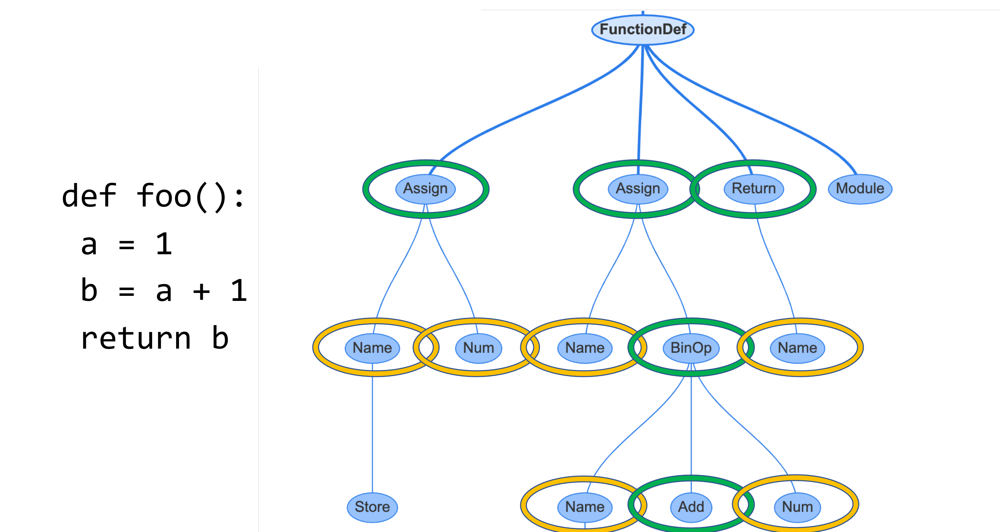

## Halstead Metrics

$$
    Operands = \sum{Values} + \sum{variables}
$$

$$
    Operators = \sum{Built~in~syntax}
$$

$$
    Length~(N) = Operators + Operands
$$

$$
    Vocabulary~(\eta) = \exists!(Operators) + \exists!(Operands)
$$

----

$$
    Volume~(V) = N \times log_2(\eta)
$$

$$
    Difficulty~(D) = \frac{\exists!(Operators)}{2} + \frac{\exists!(Operands)}{Operands}\\
$$

$$
    Effort~(E) = V \times D
$$

- $V$ es mejor que $LoC$ (L)
- $D$ es un buen complemento de $CC$.

## Índice de Mantenibilidad

$$ MI = 171 - 5.2 \times ln(V) − 0.23 \times (C) - 16.2 \times ln(L) $$

Donde:

- $V$ Volumen
- $C$ Complejidad ciclomática
- $L$ Line of code

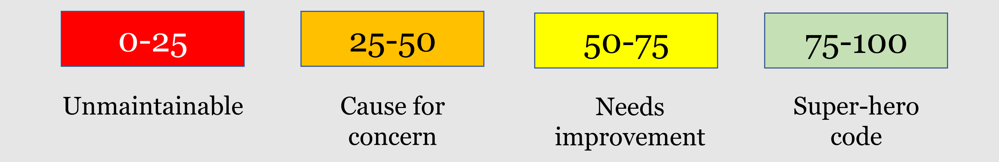

## Índice de Mantenibilidad

$$ MI = 171 - 5.2 \times ln(V) − 0.23 \times (C) - 16.2 \times ln(L) $$

- El uso de esta fórmula significaba que $MI \in [171, \infty)$
- Microsoft en el 2011 para su herramienta VisualStudio (NO code) decide acotarla entre $[0, 100]$. [Ver](https://learn.microsoft.com/en-us/visualstudio/code-quality/code-metrics-maintainability-index-range-and-meaning?view=vs-2022)


$$ MsMI = \max\{0, \frac{MI}{171}\}$$




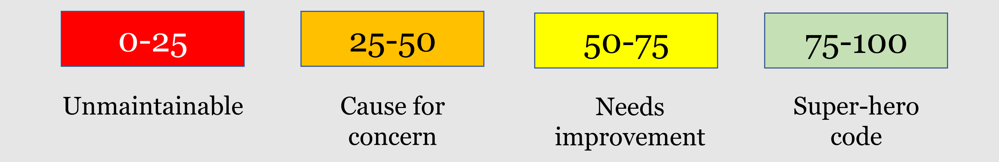

## Radon

Radon is a Python tool that computes various metrics from the source code. Radon can compute:

- McCabe's complexity, i.e. cyclomatic complexity
- raw metrics (these include SLOC, comment lines, blank lines, &c.)
- Halstead metrics (all of them)
- Maintainability Index (the one used in Visual Studio)

```console
$ pip install radon
```


## Radon - Cyclomatic Complexity

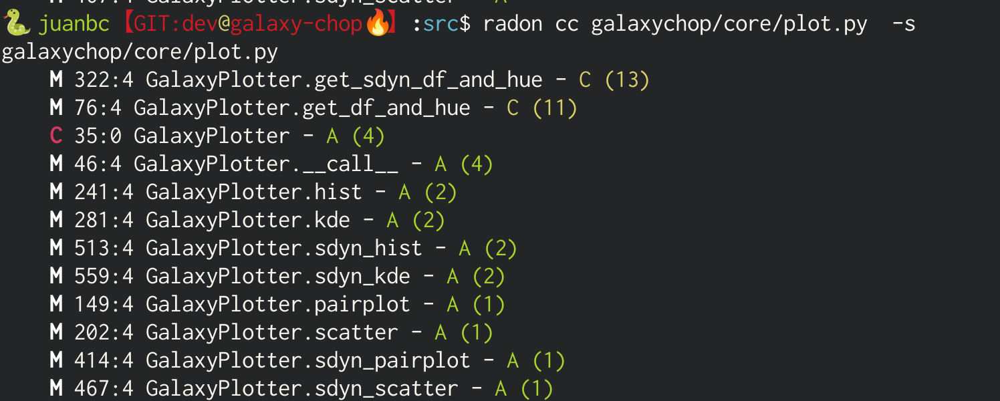

## Radon - Maintainability Index

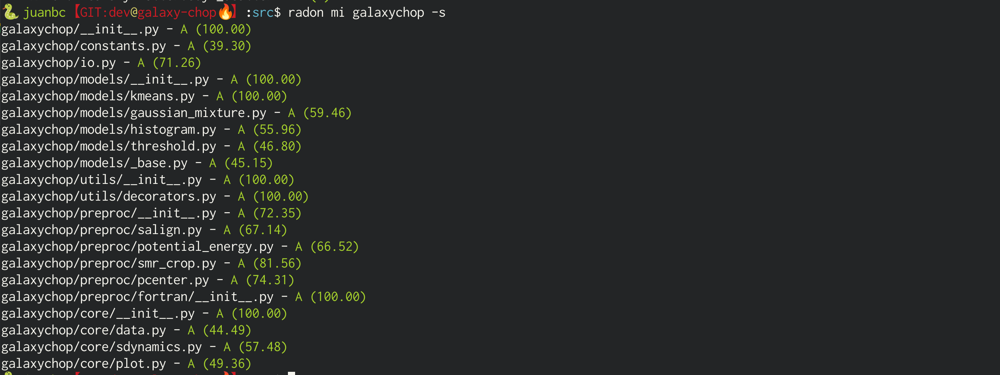

## Radon - Halsted

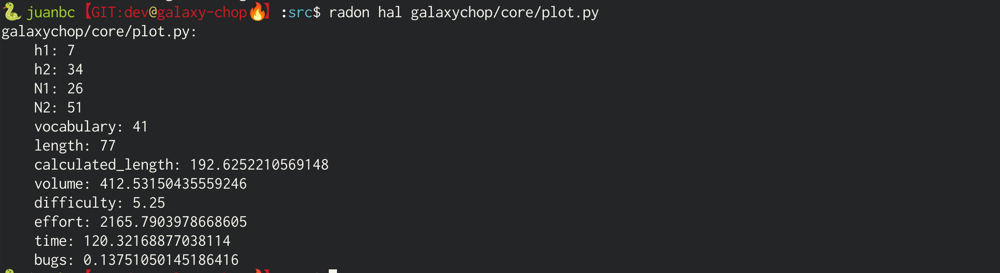

## Todo muy lindo... y ahora?

- Tenemos las métricas, que hacemos con ellas?
- Lo piola seria ver tendencias en tiempo.

## Wily 

Wily itera sobre un repositorio git e indexa la complejidad de los archivos fuente de Python utilizando varios algoritmos. 

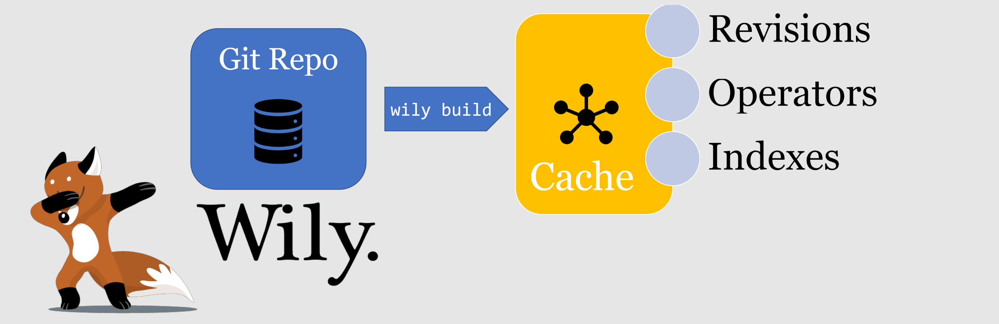

```bash
$ pip install wily
```


 Wily - Comandos Básicos


## Wily report

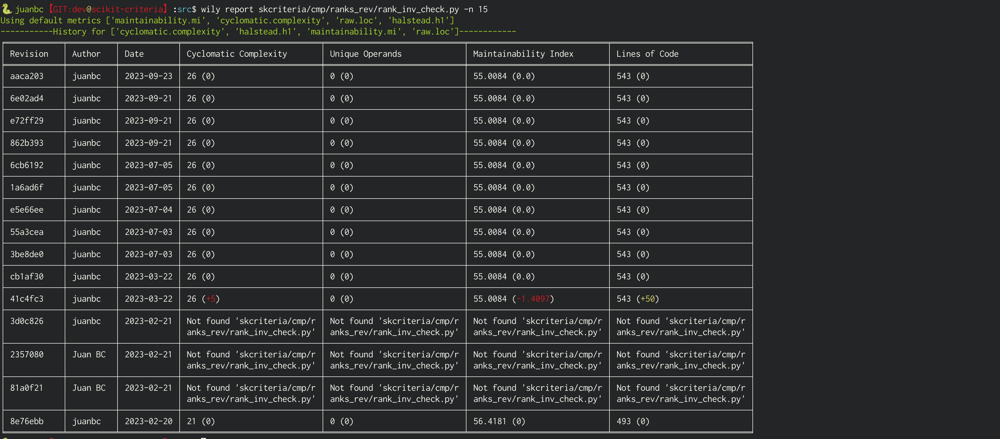

## Wily graph

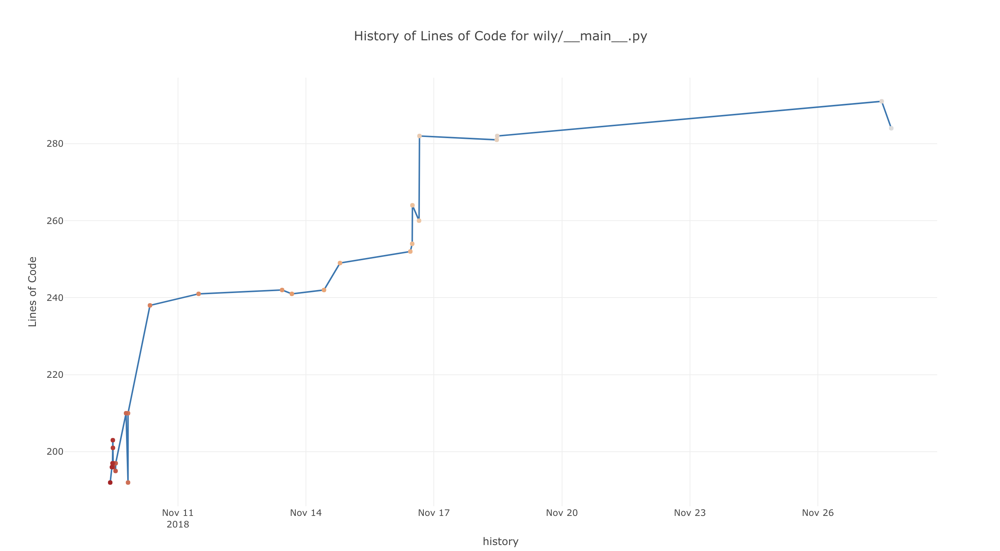

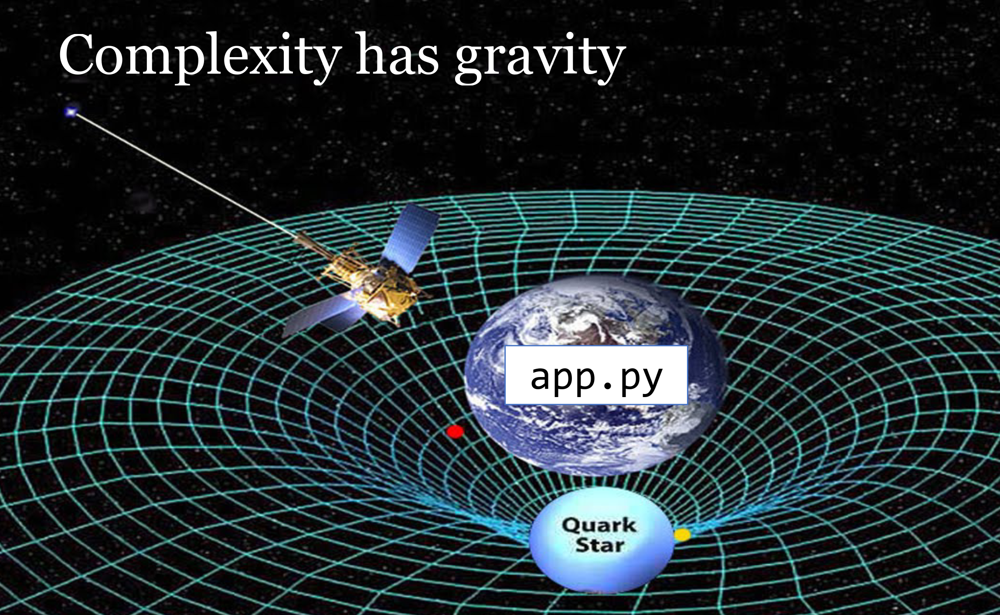

O en cristiano: si algo es complejo, tiende a volverse más complejo

## Tema de TFC

### Implementación de Sistema Modular para Análisis Estático Multi-lenguaje


#### Trabajo
Este proyecto propone expandir las capacidades de Wily eliminando su dependencia directa de Radon, implementando un sistema de plugins que permita el análisis de diferentes lenguajes de programación. Opcionalmente, se podrá desarrollar una interfaz interactiva para la exploración y visualización de las métricas capturadas.

## Coupling

Si tenemos:

$$A \in \mathcal{C}$$

Donde:
- $A$ representa la clase A
- $\mathcal{C}$ representa el conjunto de clases tal que $\mathcal{C} = \{A, X_1, X_2, ..., X_n\}$


## Coupling

El acoplamiento es: 

$$Coupling(A) = \{X \in \mathcal{C} \mid X \neq A \land D(A, X) > 0\}$$

Donde:
- $A$ es la clase cuyo acoplamiento queremos medir
- $\mathcal{C}$ es el conjunto de todas las clases del sistema
- $D(A, X)$ es una función que mide el grado de dependencia entre la clase $A$ y la clase $X$
- $X \neq A$ asegura que excluimos la propia clase $A$ de la medición
- $D(A, X) > 0$ indica que existe algún tipo de dependencia

Lo que queremos medir tiene la forma de:

$$CouplingValue(A) = \sum_{X \in \mathcal{C}, X \neq A} D(A, X)$$


## Tipos de Acoplamiento (Coupling)

- **Data Coupling (Mejor):** Módulos que intercambian únicamente datos simples necesarios a través de parámetros, manteniendo independencia y encapsulamiento.

- **Stamp Coupling:** Módulos que comparten estructuras de datos completas aunque solo necesiten parte de la información, creando dependencias innecesarias.

- **Control Coupling:** Módulos donde uno controla el flujo de ejecución del otro mediante banderas o parámetros que determinan el comportamiento.

- **External Coupling:** Módulos que dependen de formatos o protocolos externos compartidos, dictados por entidades o sistemas ajenos.

- **Common Coupling:** Módulos que acceden y modifican datos globales compartidos, creando interdependencias ocultas y efectos secundarios impredecibles.

- **Content Coupling (Peor):** Módulos que acceden o modifican directamente los datos internos de otros módulos, violando el encapsulamiento y creando dependencias estrictas.


## Coupling - **LA** Métrica

Fenton y Melton proponen medir el acoplamiento como:

$$c(x,y) = i + \frac{n}{n+1}$$

donde:
- $i$: es la peor relación $R_i$ de acoplamiento entre $x$ e $y$
- $n$: es el número de interconexiones entre $x$ e $y$

Se puede definir $C$, la medida de acoplamiento general de un sistema:

$$C(S) = \text{valor medio } C(D_i, D_j)$$

## Coupling - Instability

### Acoplamiento Eferente (Ce)

- Mide cuántos componentes necesita una clase para funcionar
- Alto $Ce$, difícil de reutilizar, probar y mantener
- Viola el principio de responsabilidad única

## Acoplamiento Aferente (Ca)

- Mide cuántos componentes dependen de una clase particular
- Alto $Ca$ no siempre es malo (ej: en frameworks centrales)
- Un componente con alto $Ca$ debe mantenerse pequeño

## Coupling - Instability

$$I = Ce / (Ce + Ca)$$

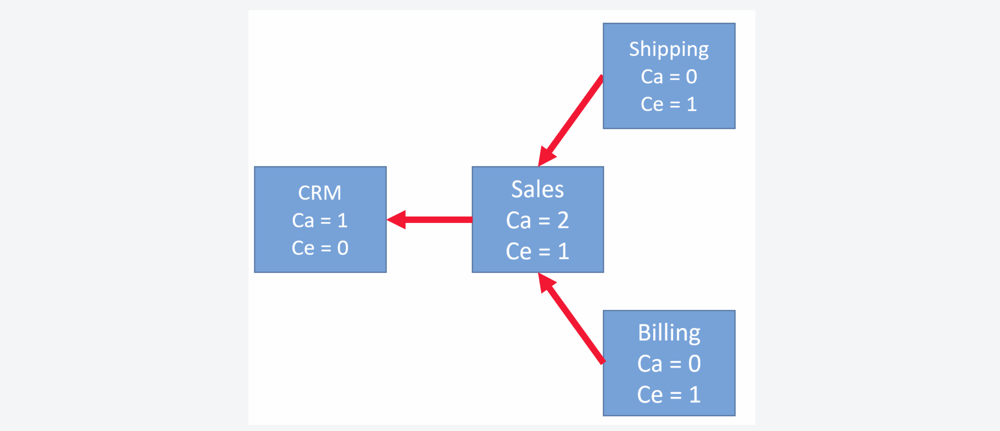

## Cohesion

• La cohesión define el grado en que los elementos de un módulo pertenecen juntos o están interrelacionados.

• Por lo tanto, la cohesión mide la fortaleza de las relaciones entre piezas de funcionalidad dentro de un módulo dado.

• Un buen diseño de software tendrá alta cohesión.

## Cohesion

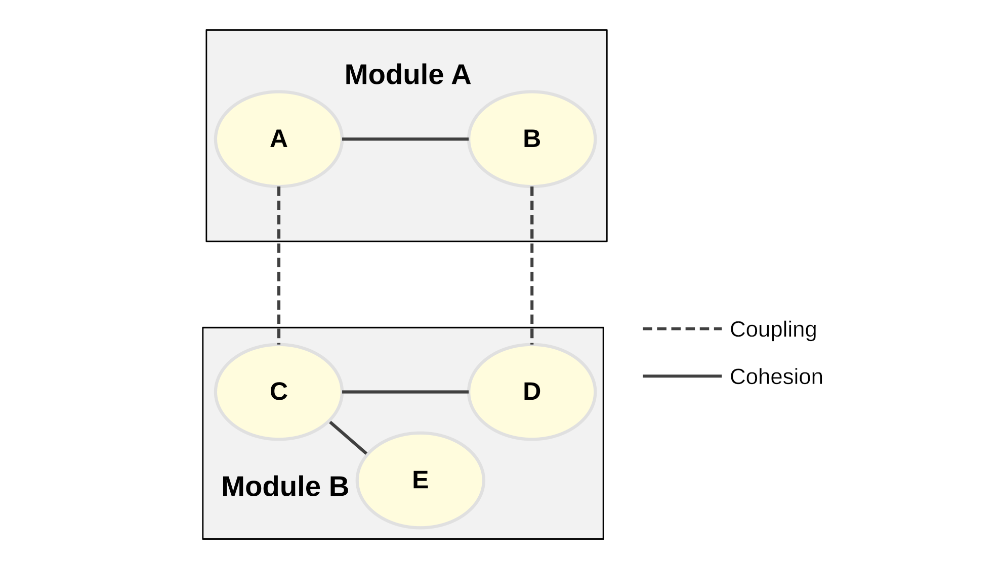

## Cohesion

Si tenemos:

$$M \in S$$

Donde:
* $M$ representa un módulo
* $S$ representa el conjunto de módulos tal que $S = \{M, E_1, E_2, ..., E_n\}$ donde cada $E$ es un elemento del módulo

## Cohesion

La cohesión es:

$$Cohesion(M) = \{E \in M \mid \sum R(E, F) > 0\}$$

Donde:
* $M$ es el módulo cuya cohesión queremos medir
* $E, F$ son elementos dentro del módulo $M$
* $R(E, F)$ es una función que mide el grado de relación entre los elementos $E$ y $F$ dentro del mismo módulo

## Cohesion - Tipos

• **Cohesión Coincidental (Baja/"Peor")**: Agrupa elementos que apenas están relacionados entre sí, como una calculadora que combina operaciones ADD, SUB, MUL y DIV sin un propósito común claro.

• **Cohesión Lógica**: Elementos que realizan operaciones similares pero no están necesariamente vinculados, como un módulo que maneja diferentes tipos de errores o realiza distintas operaciones de ordenamiento.

• **Cohesión Temporal**: Elementos relacionados por el momento en que se ejecutan, típico en módulos de inicialización donde varias tareas ocurren simultáneamente (inicializar contadores, abrir archivos, etc.).

• **Cohesión Procedural**: Elementos que deben ejecutarse en una secuencia específica para lograr un objetivo, como llamadas a funciones encadenadas o pasos de un algoritmo que dependen del resultado anterior.

• **Cohesión Comunicacional**: Elementos que trabajan sobre los mismos datos de entrada y salida usando las mismas estructuras, como actualizar un registro en la base de datos y luego enviarlo a imprimir.

• **Cohesión Secuencial**: La salida de un elemento sirve como entrada para otros elementos dentro del mismo módulo, como en un proceso donde se ingresan números, se realiza una suma y luego se muestra el resultado.

• **Cohesión Funcional (Alta/"Mejor")**: Un módulo enfocado en realizar un único tipo de funcionalidad a través de sus diferentes elementos, como un sistema de reserva de trenes que ejecuta todas las operaciones relacionadas con una sola tarea de manera centrada y eficiente.

## Cohesion - Lack of Cohesion of Methods (LCOM)

La Falta de Cohesión de Métodos (LCOM) es una correlación entre los métodos y las variables de instancia locales de una clase (usamos la versión sugerida por Henderson-Sellers et al. [19], también conocida como LCOM5). Sea *m* el número de métodos, *a* el número de atributos y *μ<sub>j</sub>* la cantidad de métodos que utilizan el atributo *j*, entonces,

$$LCOM = \frac{1}{1-m}\left(\frac{1}{a}\sum_{j=1}^{a}\mu_j\right)-m$$

## Cohesion - Method-Method through Attributes Cohesion (MMAC)

La métrica de Cohesión Método-Método a través de Atributos (MMAC) introducida por Dallal y Briand [13], es el promedio de cohesión de todos los pares de métodos. Sea *k* el número de métodos, *l* el número de tipos de parámetros distintos, y *x<sub>i</sub>* el número de métodos que utilizan el tipo *i*, entonces,

$$MMAC = \frac{1}{lk(k-1)} \sum_{i=1}^{l} x_i(x_i - 1).$$

## Cohesion - Normalized Hamming Distance (NHD)

La métrica de cohesión de clase Distancia de Hamming Normalizada (NHD), introducida por Counsell et al. [11], mide la similitud en todos los métodos de una clase en términos de los tipos de sus argumentos. Sea *l* el número de tipos de parámetros distintos, *k* el número de métodos, y *c<sub>j</sub>* el número de métodos que tienen un parámetro de tipo *j*, entonces,

$$NHD = 1 - \frac{2}{lk(k-1)} \sum_{j=1}^{l} c_j(k - c_j).$$

## Cohesion - Sensitive Class Cohesion Metric (SCOM)

La Métrica de Cohesión de Clase Sensible (SCOM), introducida por Fernández y Peña [14], es una proporción de la suma de las intensidades de conexión *C<sub>i,j</sub>* de todos los pares *(i,j)* de *m* métodos respecto al número total de pares de métodos. La intensidad de conexión debe recibir mayor peso *α<sub>i,j</sub>* cuando dicho par involucra más atributos:

$$SCOM = \frac{2}{m(m-1)} \sum_{i=1}^{m-1} \sum_{j=i+1}^{m} C_{i,j} \times \alpha_{i,j}$$

## Referencias

- [Shaw, A. (2019). Wily Python: Writing simpler and more maintainable Python - PyCon 2019 [Video]. YouTube. https://youtube.com/watch?v=[ID del video]&ab_channel=PyCon2019](https://www.youtube.com/watch?v=dqdsNoApJ80)
  
- [Bugayenko, Y. (s.f.). SSD 15/16: Coupling & Cohesion and Other Metrics [software design crash course] [Video]. YouTube. https://youtube.com/watch?v=GxpxDHa3bXE&ab_channel=YegorBugayenko](https://www.youtube.com/watch?v=GxpxDHa3bXE&ab_channel=YegorBugayenko)
  
- [Estévez, E., & Casalini, C. (2011). Administración y Gestión de Proyectos de Software [Presentación de diapositivas]. Universidad Nacional del Sur, Departamento de Ciencias e Ingeniería de la Computación. Segundo cuatrimestre.](https://cs.uns.edu.ar/~mcca/home/files/aygps11/Metricas-Parte2.pdf)

- [CS & IT Tutorials by Vrushali. (s.f.). SE 23: Coupling & Cohesion with Examples | Software Engineering [Video]. YouTube. https://youtube.com/watch?v=vHdx0uMaO3E&ab_channel=CS%26ITTutorialsbyVrushali](https://www.youtube.com/watch?v=vHdx0uMaO3E)

- [Comartin, D. (2021, February 3). Write Stable Code using Coupling Metrics. CodeOpinion. https://codeopinion.com/write-stable-code-using-coupling-metrics/](https://codeopinion.com/write-stable-code-using-coupling-metrics/)